### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:gold;"> CAPSTONE PROJECT - CAR DETECTION

##### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:yellow;"> COMPUTER VISION PROJECT- PROJECT BY GROUP 8

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:cyan;">Step 1: Import the data

In [75]:
import numpy as np
import plotly.express as px
import os
import zipfile
import cv2
from PIL import Image
from IPython.display import display
import ipywidgets as widgets
from matplotlib import pyplot as plt
import matplotlib.patches as patches
from collections import defaultdict
from io import StringIO
from PIL import Image
import random
from IPython.display import display
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
import warnings
import pickle
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import plotly.graph_objs as go
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping
warnings.filterwarnings("ignore")

In [3]:
car_data_zip_path = 'C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Pre requisites/Car+Images.zip'
annotation_zip_path = 'C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Pre requisites/Annotations.zip'

destination_folder = 'C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Pre requisites'

if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)

with zipfile.ZipFile(car_data_zip_path, 'r') as car_data_zip:
    car_data_zip.extractall(os.path.join(destination_folder, 'car_data_extracted'))

with zipfile.ZipFile(annotation_zip_path, 'r') as annotation_zip:
    annotation_zip.extractall(os.path.join(destination_folder, 'annotations_extracted'))

print("Data extracted and stored in the destination folder.")

Data extracted and stored in the destination folder.


In [4]:
carmodel_file = 'C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Pre requisites/Car+names+and+make.csv'
car_data = pd.read_csv(carmodel_file)
print("Car Data:")
print(car_data.head())

Car Data:
  AM General Hummer SUV 2000
0        Acura RL Sedan 2012
1        Acura TL Sedan 2012
2       Acura TL Type-S 2008
3       Acura TSX Sedan 2012
4  Acura Integra Type R 2001


###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:cyan;">Step 2: Map training and testing images to its classes

In [6]:
def process_images(folder_path):
    data = []

    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                car_name = os.path.basename(root)
                car_model = car_name.split()[-1]
                car_model_1 = ' '.join(car_name.split()[:-1])
                image_name = file
                image_location = os.path.join(root, file)

                data.append({
                    'carName': car_name,
                    'carModel': car_model,
                    'carModel_1': car_model_1,
                    'Image Name': image_name,
                    'Image Location': image_location
                })

    return data

# Defining the path to the main folder containing subfolders with images
Train_image_folder = 'C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Pre requisites/car_data_extracted/Car Images/Train Images'

# Processing images recursively
Train_data = process_images(Train_image_folder)

# Creating a DataFrame
Train_data_df = pd.DataFrame(Train_data)

# Displaying the final DataFrame with image locations
Train_data_df.head()

,carName,carModel,carModel_1,Image Name,Image Location
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00198.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...
1,Acura Integra Type R 2001,2001,Acura Integra Type R,00255.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...
2,Acura Integra Type R 2001,2001,Acura Integra Type R,00308.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...
3,Acura Integra Type R 2001,2001,Acura Integra Type R,00374.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...
4,Acura Integra Type R 2001,2001,Acura Integra Type R,00878.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...


In [7]:
def process_images(folder_path):
    data = []

    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                car_name = os.path.basename(root)
                car_model = car_name.split()[-1]
                car_model_1 = ' '.join(car_name.split()[:-1])
                image_name = file
                image_location = os.path.join(root, file)

                data.append({
                    'carName': car_name,
                    'carModel': car_model,
                    'carModel_1': car_model_1,
                    'Image Name': image_name,
                    'Image Location': image_location
                })

    return data

# Defining the path to the main folder containing subfolders with images
Test_image_folder = 'C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Pre requisites/car_data_extracted/Car Images/Test Images'

# Processing images recursively
Test_data = process_images(Test_image_folder)

# Creating DataFrame
Test_data_df = pd.DataFrame(Test_data)

# Displaying the final DataFrame
Test_data_df.head()

,carName,carModel,carModel_1,Image Name,Image Location
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00128.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...
1,Acura Integra Type R 2001,2001,Acura Integra Type R,00130.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...
2,Acura Integra Type R 2001,2001,Acura Integra Type R,00386.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...
3,Acura Integra Type R 2001,2001,Acura Integra Type R,00565.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...
4,Acura Integra Type R 2001,2001,Acura Integra Type R,00711.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...


###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:pink;">Lets visualize few images

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:lightblue;">a : Train Images

In [21]:
Train_data_df.shape

(8144, 5)

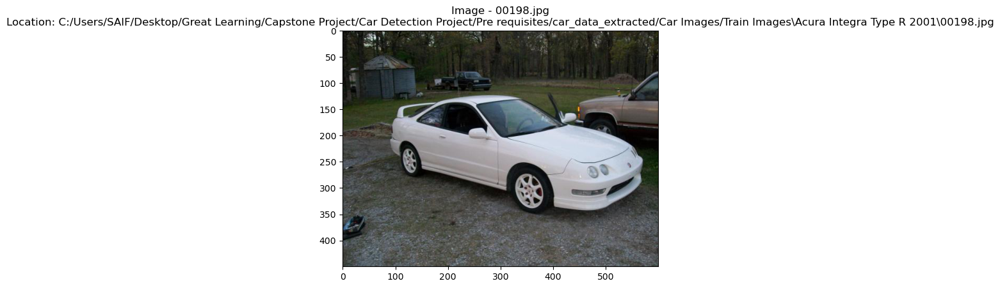

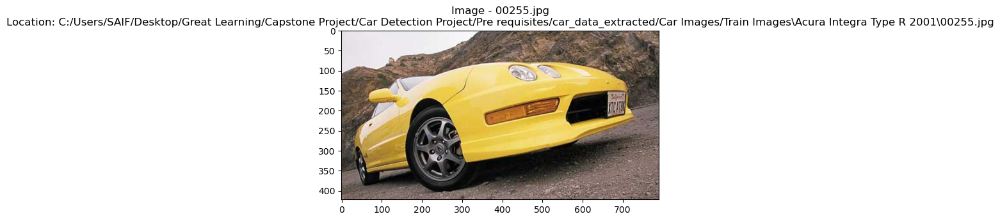

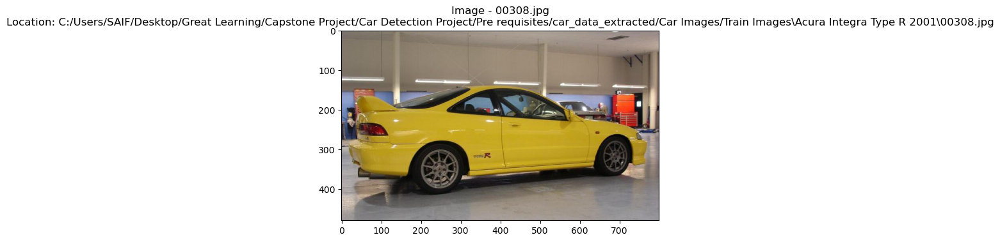

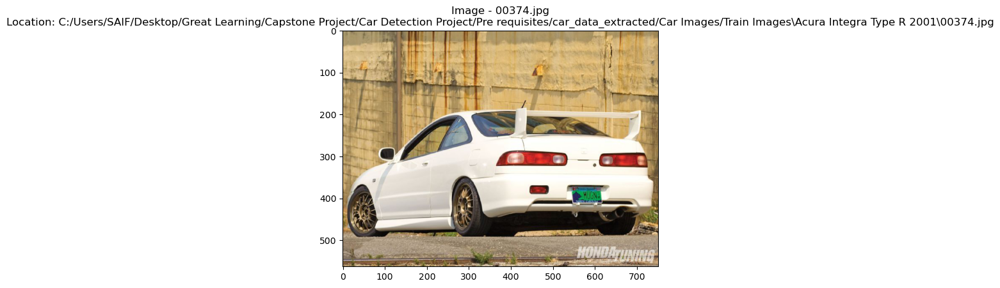

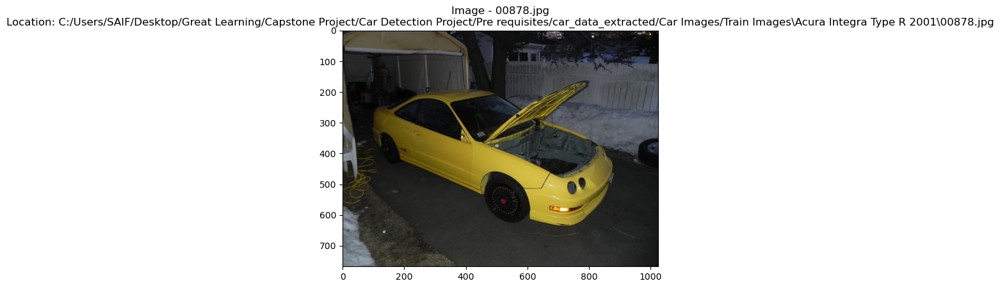

In [109]:
for index, row in Train_data_df.head(5).iterrows():
    image_path = row['Image Location']
    img = Image.open(image_path)
    plt.imshow(img)
    plt.title(f'Image - {row["Image Name"]}\nLocation: {row["Image Location"]}')
    plt.show()

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:lightblue;">b : Test Images

In [19]:
Test_data_df.shape

(8041, 5)

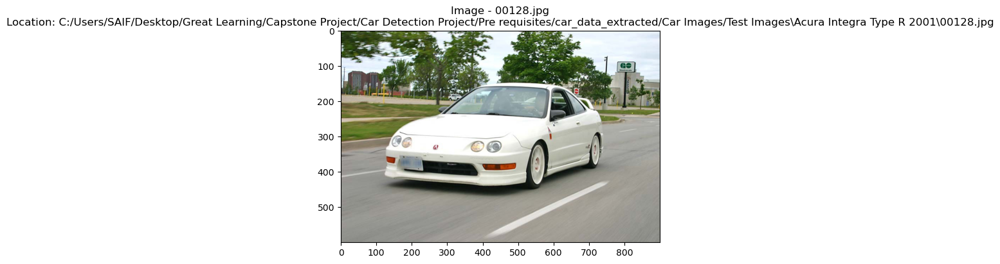

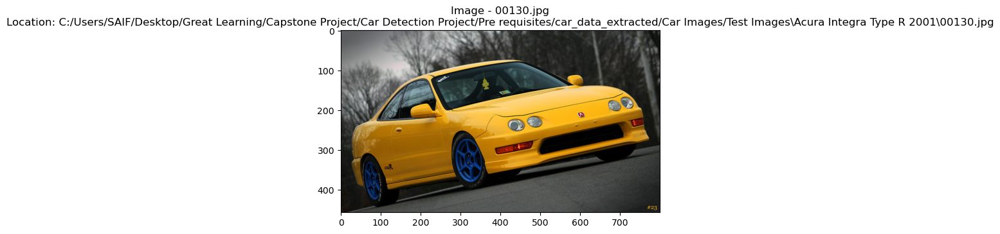

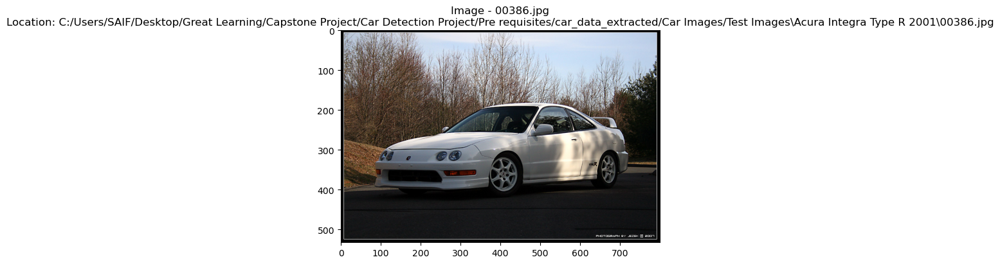

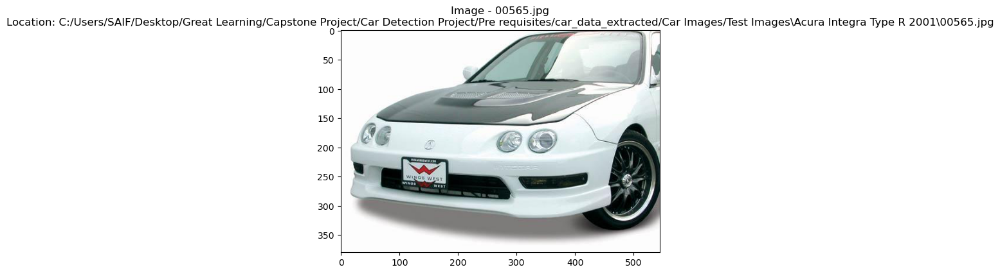

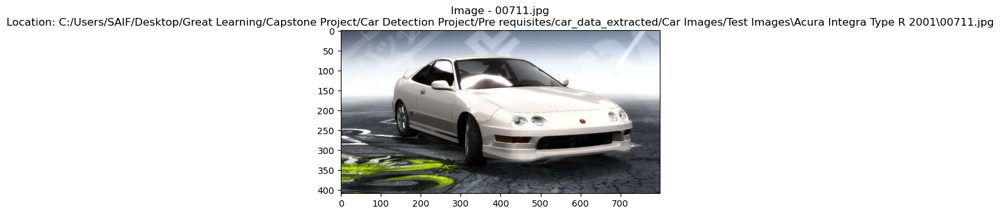

In [110]:
for index, row in Test_data_df.head(5).iterrows():
    image_path = row['Image Location']
    img = Image.open(image_path)
    plt.imshow(img)
    plt.title(f'Image - {row["Image Name"]}\nLocation: {row["Image Location"]}')
    plt.show()

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:cyan;">Step 3: Map training and testing images to its annotations

In [22]:
train_annotations = pd.read_csv("C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Pre requisites/annotations_extracted/Annotations/Train Annotations.csv")
test_annotations = pd.read_csv("C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Pre requisites/annotations_extracted/Annotations/Test Annotation.csv")

In [23]:
train_annotations

,Image Name,Bounding Box coordinates,Unnamed: 2,Unnamed: 3,Unnamed: 4,Image class
0,00001.jpg,39,116,569,375,14
1,00002.jpg,36,116,868,587,3
2,00003.jpg,85,109,601,381,91
3,00004.jpg,621,393,1484,1096,134
4,00005.jpg,14,36,133,99,106
...,...,...,...,...,...,...
8139,08140.jpg,3,44,423,336,78
8140,08141.jpg,138,150,706,523,196
8141,08142.jpg,26,246,660,449,163
8142,08143.jpg,78,526,1489,908,112


###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:lightblue;">Lets remane the headings appropriately for the train data!

In [26]:
train_annotations.rename(columns = {'Bounding Box coordinates':'xmin'}, inplace = True)
train_annotations.rename(columns = {'Unnamed: 2':'ymin'}, inplace = True)
train_annotations.rename(columns = {'Unnamed: 3':'xmax'}, inplace = True)
train_annotations.rename(columns = {'Unnamed: 4':'ymax'}, inplace = True)
train_annotations.rename(columns = {'Image class':'Image_class'}, inplace = True)
train_annotations.rename(columns = {'Image Name':'Image Name'}, inplace = True)
train_annotations

,Image Name,xmin,ymin,xmax,ymax,Image_class
0,00001.jpg,39,116,569,375,14
1,00002.jpg,36,116,868,587,3
2,00003.jpg,85,109,601,381,91
3,00004.jpg,621,393,1484,1096,134
4,00005.jpg,14,36,133,99,106
...,...,...,...,...,...,...
8139,08140.jpg,3,44,423,336,78
8140,08141.jpg,138,150,706,523,196
8141,08142.jpg,26,246,660,449,163
8142,08143.jpg,78,526,1489,908,112


In [27]:
test_annotations

,Image Name,Bounding Box coordinates,Unnamed: 2,Unnamed: 3,Unnamed: 4,Image class
0,00001.jpg,30,52,246,147,181
1,00002.jpg,100,19,576,203,103
2,00003.jpg,51,105,968,659,145
3,00004.jpg,67,84,581,407,187
4,00005.jpg,140,151,593,339,185
...,...,...,...,...,...,...
8036,08037.jpg,49,57,1169,669,63
8037,08038.jpg,23,18,640,459,16
8038,08039.jpg,33,27,602,252,17
8039,08040.jpg,33,142,521,376,38


###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:lightblue;">Lets remane the headings appropriately for the test data!

In [29]:
test_annotations.rename(columns = {'Bounding Box coordinates':'xmin'}, inplace = True)
test_annotations.rename(columns = {'Unnamed: 2':'ymin'}, inplace = True)
test_annotations.rename(columns = {'Unnamed: 3':'xmax'}, inplace = True)
test_annotations.rename(columns = {'Unnamed: 4':'ymax'}, inplace = True)
test_annotations.rename(columns = {'Image class':'Image_class'}, inplace = True)
test_annotations.rename(columns = {'Image Name':'Image Name'}, inplace = True)
test_annotations

,Image Name,xmin,ymin,xmax,ymax,Image_class
0,00001.jpg,30,52,246,147,181
1,00002.jpg,100,19,576,203,103
2,00003.jpg,51,105,968,659,145
3,00004.jpg,67,84,581,407,187
4,00005.jpg,140,151,593,339,185
...,...,...,...,...,...,...
8036,08037.jpg,49,57,1169,669,63
8037,08038.jpg,23,18,640,459,16
8038,08039.jpg,33,27,602,252,17
8039,08040.jpg,33,142,521,376,38


###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:lightblue;">Now, Lets merge the dataframe of annotations and image dataframe for the train data!

In [30]:
Train_final_df = pd.merge(Train_data_df, train_annotations, how='inner',left_on='Image Name', right_on='Image Name')

In [31]:
Train_final_df.head(20)

,carName,carModel,carModel_1,Image Name,Image Location,xmin,ymin,xmax,ymax,Image_class
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00198.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,91,121,574,357,6
1,Acura Integra Type R 2001,2001,Acura Integra Type R,00255.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,29,78,734,396,6
2,Acura Integra Type R 2001,2001,Acura Integra Type R,00308.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,16,136,775,418,6
3,Acura Integra Type R 2001,2001,Acura Integra Type R,00374.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,9,184,740,499,6
4,Acura Integra Type R 2001,2001,Acura Integra Type R,00878.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,101,162,882,650,6
5,Acura Integra Type R 2001,2001,Acura Integra Type R,00898.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,89,68,483,310,6
6,Acura Integra Type R 2001,2001,Acura Integra Type R,01010.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,6,3,932,639,6
7,Acura Integra Type R 2001,2001,Acura Integra Type R,01012.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,58,72,763,529,6
8,Acura Integra Type R 2001,2001,Acura Integra Type R,01255.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,17,80,735,492,6
9,Acura Integra Type R 2001,2001,Acura Integra Type R,01617.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,62,150,543,339,6


In [32]:
train_annotations.iloc[3677]

Image Name     03678.jpg
xmin                  66
ymin                  79
xmax                 224
ymax                 168
Image_class          190
Name: 3677, dtype: object

In [33]:
Train_final_df.shape

(8144, 10)

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:lightblue;">Now, Lets merge the dataframne of annotations and image dataframe for the test data!

In [35]:
Test_final_df = pd.merge(Test_data_df, test_annotations,how='inner', left_on='Image Name', right_on='Image Name')

In [36]:
Test_final_df.head(20)

,carName,carModel,carModel_1,Image Name,Image Location,xmin,ymin,xmax,ymax,Image_class
0,Acura Integra Type R 2001,2001,Acura Integra Type R,00128.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,122,149,743,455,6
1,Acura Integra Type R 2001,2001,Acura Integra Type R,00130.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,27,74,774,449,6
2,Acura Integra Type R 2001,2001,Acura Integra Type R,00386.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,86,184,723,425,6
3,Acura Integra Type R 2001,2001,Acura Integra Type R,00565.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,15,1,545,347,6
4,Acura Integra Type R 2001,2001,Acura Integra Type R,00711.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,126,65,735,347,6
5,Acura Integra Type R 2001,2001,Acura Integra Type R,01002.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,54,225,499,610,6
6,Acura Integra Type R 2001,2001,Acura Integra Type R,01035.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,25,23,761,529,6
7,Acura Integra Type R 2001,2001,Acura Integra Type R,01176.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,289,433,1462,904,6
8,Acura Integra Type R 2001,2001,Acura Integra Type R,01326.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,40,108,1250,752,6
9,Acura Integra Type R 2001,2001,Acura Integra Type R,01864.jpg,C:/Users/SAIF/Desktop/Great Learning/Capstone ...,78,110,410,314,6


In [37]:
Test_final_df.shape

(8041, 10)

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:pink;">Lets have a look at the sanity of the data and take appropriate steps if necessary!

In [38]:
Train_final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8144 entries, 0 to 8143
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   carName         8144 non-null   object
 1   carModel        8144 non-null   object
 2   carModel_1      8144 non-null   object
 3   Image Name      8144 non-null   object
 4   Image Location  8144 non-null   object
 5   xmin            8144 non-null   int64 
 6   ymin            8144 non-null   int64 
 7   xmax            8144 non-null   int64 
 8   ymax            8144 non-null   int64 
 9   Image_class     8144 non-null   int64 
dtypes: int64(5), object(5)
memory usage: 699.9+ KB


In [39]:
Test_final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8041 entries, 0 to 8040
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   carName         8041 non-null   object
 1   carModel        8041 non-null   object
 2   carModel_1      8041 non-null   object
 3   Image Name      8041 non-null   object
 4   Image Location  8041 non-null   object
 5   xmin            8041 non-null   int64 
 6   ymin            8041 non-null   int64 
 7   xmax            8041 non-null   int64 
 8   ymax            8041 non-null   int64 
 9   Image_class     8041 non-null   int64 
dtypes: int64(5), object(5)
memory usage: 691.0+ KB


In [40]:
Train_final_df['carModel'].value_counts().index

Index(['2012', '2007', '2009', '2010', '2011', '2008', '1993', '1994', '1998',
       '2001', '2006', '1991', '2000', '2002', '1997', '1999'],
      dtype='object')

In [41]:
Test_final_df['carModel'].value_counts().index

Index(['2012', '2007', '2009', '2010', '2011', '2008', '1993', '1994', '1998',
       '2001', '1991', '2002', '2006', '2000', '1999', '1997'],
      dtype='object')

In [42]:
train_class_percentage = Train_final_df['Image_class'].value_counts(normalize=True) * 100
test_class_percentage = Test_final_df['Image_class'].value_counts(normalize=True) * 100

print("Train Data Class Percentages:")
print(train_class_percentage)

print("\nTest Data Class Percentages:")
print(test_class_percentage)

Train Data Class Percentages:
119    0.834971
79     0.601670
167    0.589391
161    0.589391
144    0.577112
         ...   
175    0.380648
64     0.368369
158    0.356090
99     0.343811
136    0.294695
Name: Image_class, Length: 196, dtype: float64

Test Data Class Percentages:
119    0.845666
161    0.596941
79     0.596941
167    0.584504
43     0.572068
         ...   
175    0.373088
158    0.360652
64     0.360652
99     0.335779
136    0.298470
Name: Image_class, Length: 196, dtype: float64


###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:pink;">Lets explore the data by plotting few visualizations and performing EDA.

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:orange;">1 : Test data VS Train Data

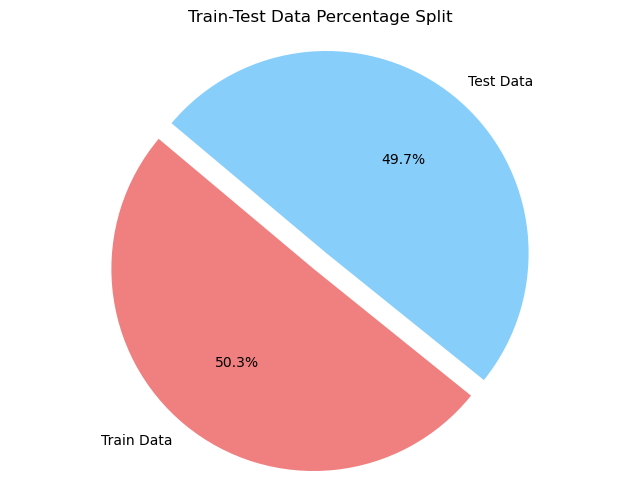

In [111]:
total_train_rows = Train_final_df.shape[0]
total_test_rows = Test_final_df.shape[0]
train_percentage = (total_train_rows / (total_train_rows + total_test_rows)) * 100
test_percentage = (total_test_rows / (total_train_rows + total_test_rows)) * 100

sizes = [total_train_rows, total_test_rows]
labels = ['Train Data', 'Test Data']
colors = ['lightcoral', 'lightskyblue']
explode = (0.1, 0)

plt.figure(figsize=(8, 6))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Train-Test Data Percentage Split')
plt.axis('equal')
plt.show()

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:orange;">2 : Cars by year of their origin

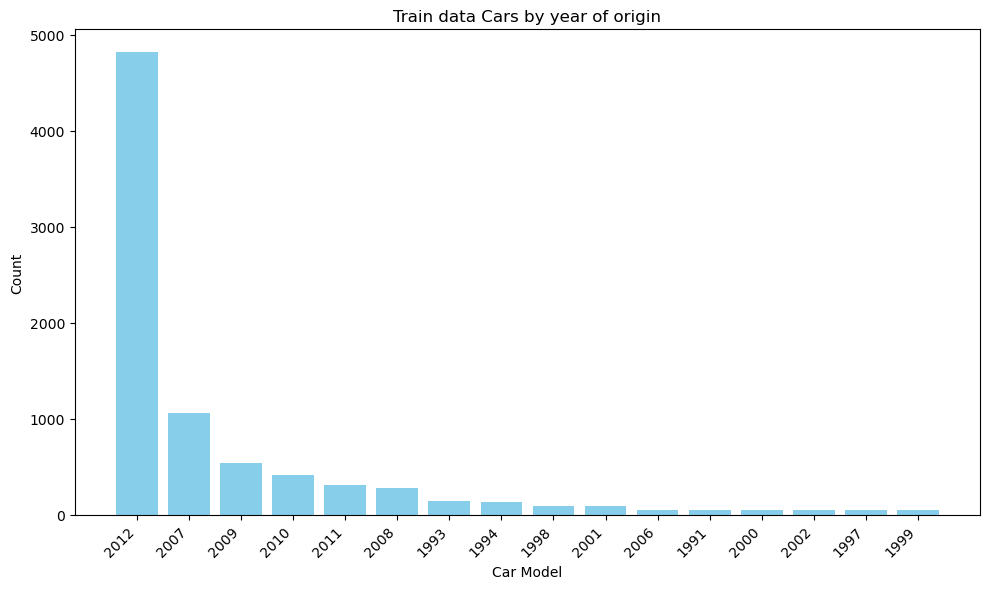

In [112]:
carModel_counts = Train_final_df['carModel'].value_counts().reset_index()
carModel_counts.columns = ['carModel', 'Count']

plt.figure(figsize=(10, 6))
plt.bar(carModel_counts['carModel'], carModel_counts['Count'], color='skyblue')
plt.xlabel('Car Model')
plt.ylabel('Count')
plt.title('Train data Cars by year of origin')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

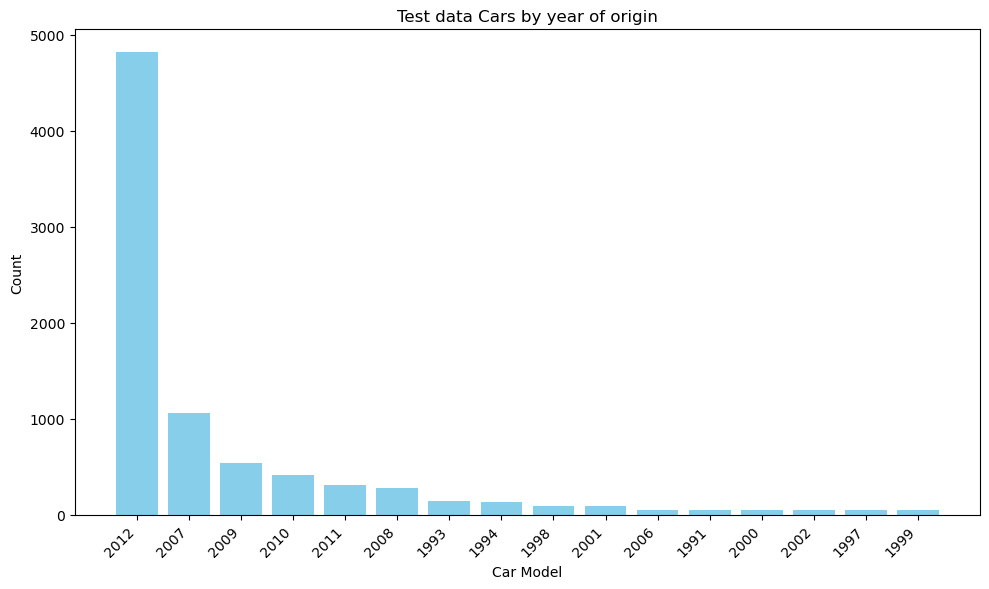

In [113]:
plt.figure(figsize=(10, 6))
plt.bar(carModel_counts['carModel'], carModel_counts['Count'], color='skyblue')
plt.xlabel('Car Model')
plt.ylabel('Count')
plt.title('Test data Cars by year of origin')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:orange;">3 : Count of top 10

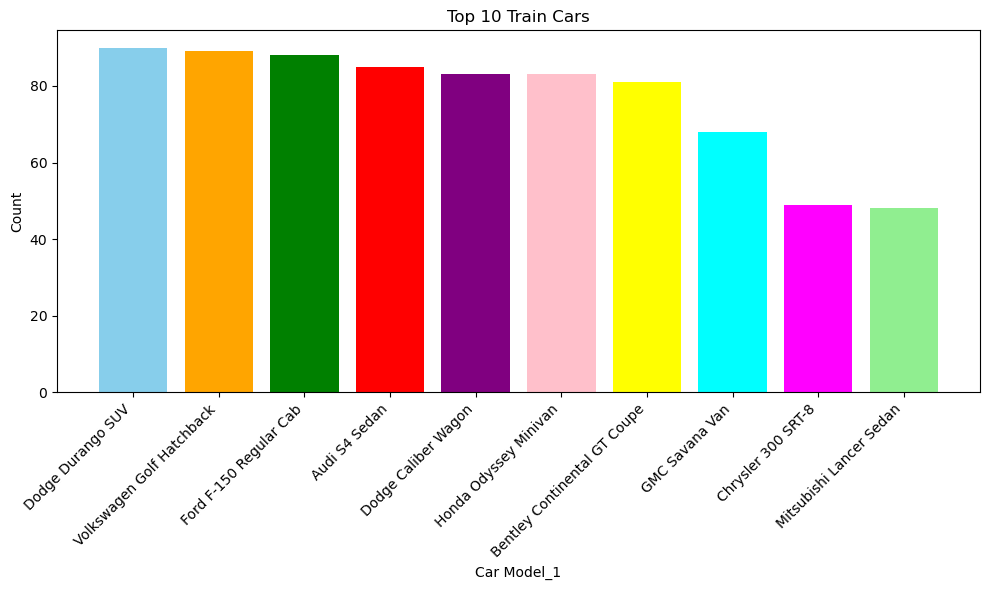

In [114]:
top_10_carModel_1 = Train_final_df['carModel_1'].value_counts().nlargest(10)
bar_colors = ['skyblue', 'orange', 'green', 'red', 'purple', 'pink', 'yellow', 'cyan', 'magenta', 'lightgreen']
plt.figure(figsize=(10, 6))
plt.bar(top_10_carModel_1.index, top_10_carModel_1.values, color=bar_colors)
plt.xlabel('Car Model_1')
plt.ylabel('Count')
plt.title('Top 10 Train Cars')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

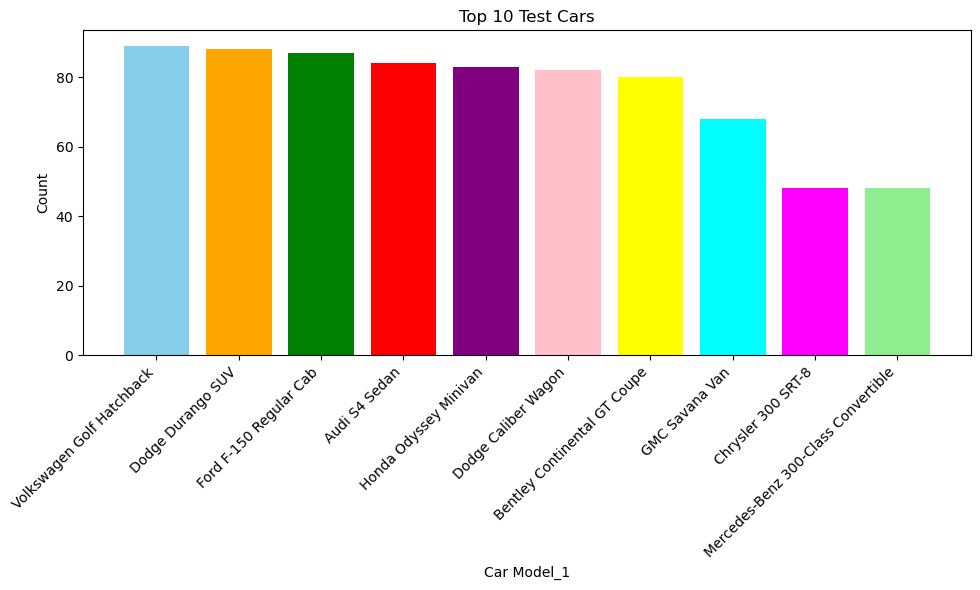

In [145]:
top_10_carModel_1 = Test_final_df['carModel_1'].value_counts().nlargest(10)
bar_colors = ['skyblue', 'orange', 'green', 'red', 'purple', 'pink', 'yellow', 'cyan', 'magenta', 'lightgreen']
plt.figure(figsize=(10, 6))
plt.bar(top_10_carModel_1.index, top_10_carModel_1.values, color=bar_colors)
plt.xlabel('Car Model_1')
plt.ylabel('Count')
plt.title('Top 10 Test Cars')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:cyan;">Step 4 : Display images with bounding box

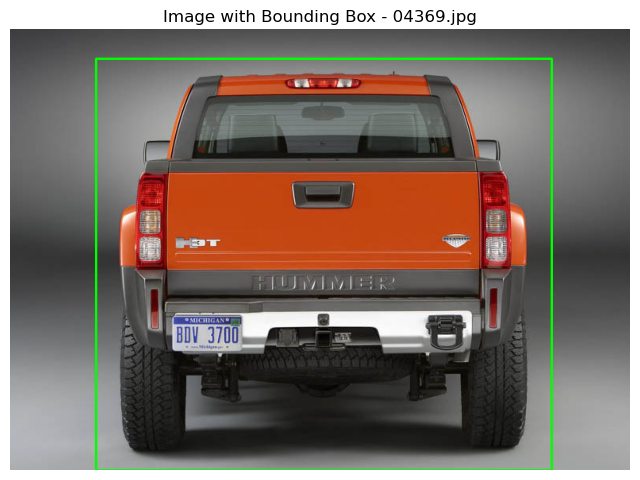

Coordinates: xmin=108, ymin=37, xmax=682, ymax=555
Car Model: HUMMER H3T Crew Cab


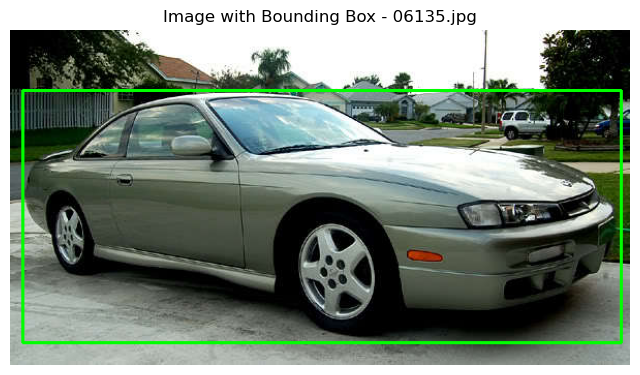

Coordinates: xmin=12, ymin=58, xmax=591, ymax=302
Car Model: Nissan 240SX Coupe


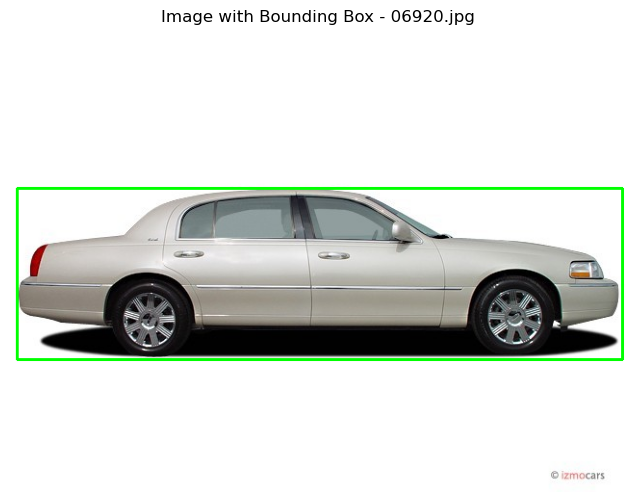

Coordinates: xmin=7, ymin=164, xmax=636, ymax=342
Car Model: Lincoln Town Car Sedan


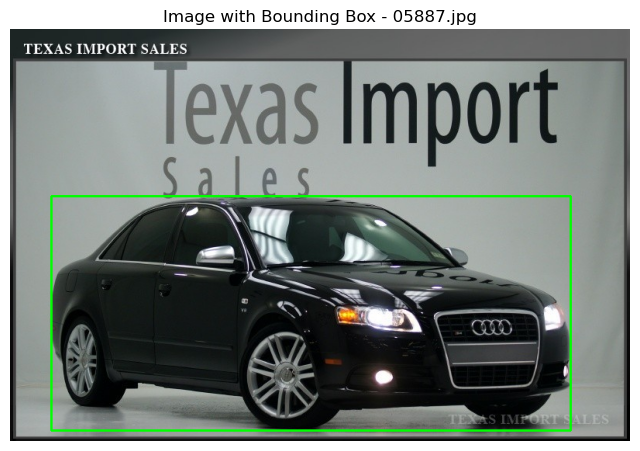

Coordinates: xmin=53, ymin=215, xmax=723, ymax=517
Car Model: Audi S4 Sedan


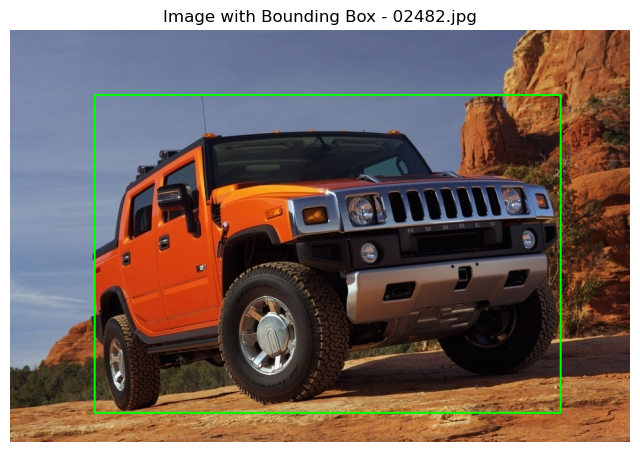

Coordinates: xmin=126, ymin=98, xmax=822, ymax=572
Car Model: HUMMER H2 SUT Crew Cab


In [122]:
def display_image_with_bounding_box(img_num):
    img_path = Train_data_df.loc[img_num, 'Image Location']
    img = cv2.imread(img_path)

    xmin = int(Train_final_df.loc[img_num, 'xmin'])
    ymin = int(Train_final_df.loc[img_num, 'ymin'])
    xmax = int(Train_final_df.loc[img_num, 'xmax'])
    ymax = int(Train_final_df.loc[img_num, 'ymax'])

    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

    car_model = Train_data_df.loc[img_num, 'carModel_1']

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.title(f'Image with Bounding Box - {Train_data_df.loc[img_num, "Image Name"]}')
    plt.axis('off')  # Remove axis
    plt.show()

    print(f'Coordinates: xmin={xmin}, ymin={ymin}, xmax={xmax}, ymax={ymax}')
    print(f'Car Model: {car_model}')

random_indices = random.sample(range(len(Train_data_df)), 5)
for img_num in random_indices:
    display_image_with_bounding_box(img_num)

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:cyan;">Step 5 : Design, train and test basic CNN models to classify the car

!pip install tensorflow

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:gold;">Model 1

In [50]:
img_width, img_height = 224, 224
batch_size = 16
train_datagen = ImageDataGenerator(rescale=1./255,
                                   shear_range=0.1,
                                   zoom_range=0.1,
                                   horizontal_flip=True)
test_datagen = ImageDataGenerator(rescale=1./255)

train_data_dir = 'C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Pre requisites/car_data_extracted/Car Images/Train Images'
test_data_dir = 'C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Pre requisites/car_data_extracted/Car Images/Test Images'

batch_size = 32
num_classes = len(Train_final_df['Image_class'].unique())  

condition = Train_final_df['Image_class'] == 'car'  
class_indices = np.where(condition)[0]
class_labels = Train_final_df['Image_class'].iloc[class_indices].tolist()

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    classes=class_labels)

validation_classes = sorted(os.listdir(test_data_dir))

validation_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    classes=validation_classes)

model_1 = Sequential()
model_1.add(Conv2D(16, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)))
model_1.add(MaxPooling2D(pool_size=(2, 2)))
model_1.add(Conv2D(32, (3, 3), activation='relu'))
model_1.add(MaxPooling2D(pool_size=(2, 2)))
model_1.add(Conv2D(128, (3, 3), activation='relu'))
model_1.add(MaxPooling2D(pool_size=(2, 2)))
model_1.add(Flatten())
model_1.add(Dense(64, activation='relu'))
model_1.add(Dense(num_classes, activation='softmax'))

model_1.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history_1 = model_1.fit(
    train_generator,
    steps_per_epoch=len(Train_final_df) // batch_size,
    epochs=10,  
    validation_data=validation_generator,
    validation_steps=len(Train_final_df) // batch_size)

Found 8144 images belonging to 196 classes.
Found 8041 images belonging to 196 classes.
Epoch 1/10
254/254 [==============================] - 291s 1s/step - loss: 5.2587 - accuracy: 0.0062 - val_loss: 5.1854 - val_accuracy: 0.0097
Epoch 2/10
254/254 [==============================] - 203s 800ms/step - loss: 5.1590 - accuracy: 0.0128
Epoch 3/10
254/254 [==============================] - 204s 804ms/step - loss: 5.0984 - accuracy: 0.0144
Epoch 4/10
254/254 [==============================] - 204s 805ms/step - loss: 4.9845 - accuracy: 0.0255
Epoch 5/10
254/254 [==============================] - 209s 824ms/step - loss: 4.8028 - accuracy: 0.0475
Epoch 6/10
254/254 [==============================] - 196s 771ms/step - loss: 4.5783 - accuracy: 0.0690
Epoch 7/10
254/254 [==============================] - 197s 775ms/step - loss: 4.3333 - accuracy: 0.0897
Epoch 8/10
254/254 [==============================] - 196s 770ms/step - loss: 4.0716 - accuracy: 0.1312
Epoch 9/10
254/254 [=====================

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:Lightblue;">Lets save the Model and Model Weights

In [53]:
model_1.save('C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Milestone 1/Milestone_1_Model_1.h5') 
model_1.save_weights('C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Milestone 1/Milestone_1_Model_1_weights.h5')
loaded_model_1 = load_model('C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Milestone 1/Milestone_1_Model_1.h5')
loaded_model_1.load_weights('C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Milestone 1/Milestone_1_Model_1_weights.h5')

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:Lightblue;">Lets analyze the model 1 performance on our Test Data

In [54]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    classes=validation_classes  
)
test_loss, test_acc = loaded_model_1.evaluate(test_generator)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

Found 8041 images belonging to 196 classes.
252/252 [==============================] - 75s 299ms/step - loss: 5.2131 - accuracy: 0.0466
Test Accuracy: 0.04663598909974098
Test Loss: 5.213118076324463


###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:Lightblue;">Let plot the  Loss as well as Accuracy for Model 1

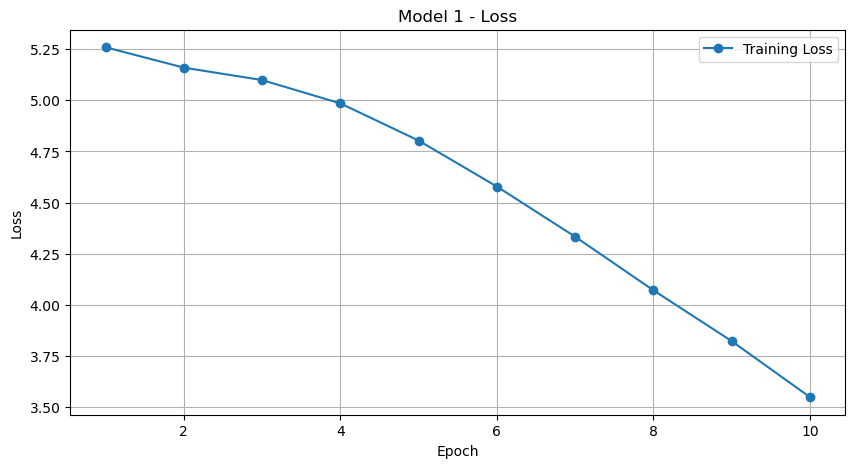

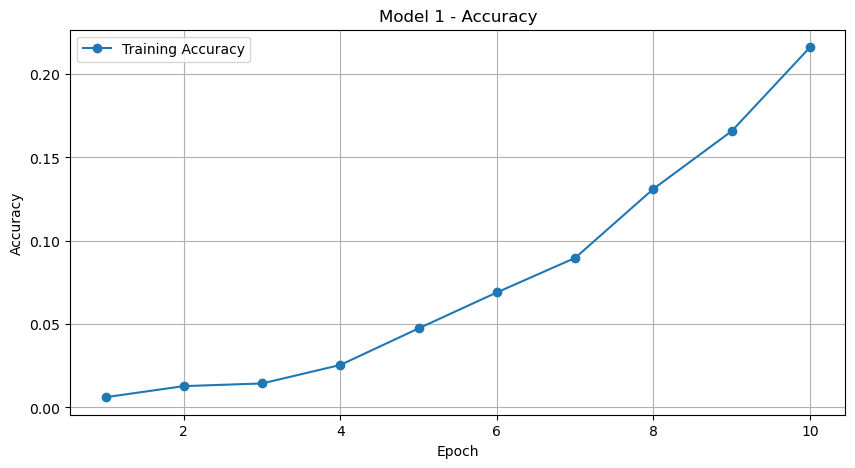

In [126]:
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(history_1.history['loss']) + 1), history_1.history['loss'], label='Training Loss', marker='o')
plt.title('Model 1 - Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(range(1, len(history_1.history['accuracy']) + 1), history_1.history['accuracy'], label='Training Accuracy', marker='o')
plt.title('Model 1 - Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:gold;">Model 2

In [137]:
model_2 = Sequential()
model_2.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)))
model_2.add(MaxPooling2D(pool_size=(2, 2)))
model_2.add(Conv2D(64, (3, 3), activation='sigmoid'))
model_2.add(MaxPooling2D(pool_size=(2, 2)))
# Number of Conventional Layers reduced

model_2.add(Flatten())
model_2.add(Dense(64, activation='sigmoid'))
model_2.add(Dense(num_classes, activation='sigmoid'))  # Activation Function for output layer changed

model_2.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy']) 
# Optimizer changed from adam to Standard-Gradient-Descent(SGD)

history_2 = model_2.fit(
    train_generator,
    steps_per_epoch=len(Train_final_df) // batch_size,
    epochs=5,  # Reduced epochs for faster training of basic model
    validation_data=validation_generator,
    validation_steps=len(Train_final_df) // batch_size)

Epoch 1/5
254/254 [==============================] - 393s 2s/step - loss: 5.2871 - accuracy: 0.0053 - val_loss: 5.2779 - val_accuracy: 0.0055
Epoch 2/5
254/254 [==============================] - 275s 1s/step - loss: 5.2787 - accuracy: 0.0063
Epoch 3/5
254/254 [==============================] - 274s 1s/step - loss: 5.2787 - accuracy: 0.0065
Epoch 4/5
254/254 [==============================] - 277s 1s/step - loss: 5.2779 - accuracy: 0.0083
Epoch 5/5
254/254 [==============================] - 274s 1s/step - loss: 5.2779 - accuracy: 0.0083


###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:Lightblue;">Lets save the Model and Model Weights

In [138]:
model_2.save('C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Milestone 1/Milestone_1_Model_2.h5') 
model_2.save_weights('C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Milestone 1/Milestone_1_Model_2_weights.h5')
loaded_model_2 = load_model('C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Milestone 1/Milestone_1_Model_2.h5')
loaded_model_2.load_weights('C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Milestone 1/Milestone_1_Model_2_weights.h5')

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:Lightblue;">Lets analyze the model 2 performance on our Test Data

In [139]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    classes=validation_classes  
)
test_loss, test_acc = loaded_model_2.evaluate(test_generator)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

Found 8041 images belonging to 196 classes.
252/252 [==============================] - 95s 375ms/step - loss: 5.2773 - accuracy: 0.0085
Test Accuracy: 0.008456659503281116
Test Loss: 5.277335166931152


###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:Lightblue;">Let plot the  Loss as well as Accuracy for Model 2

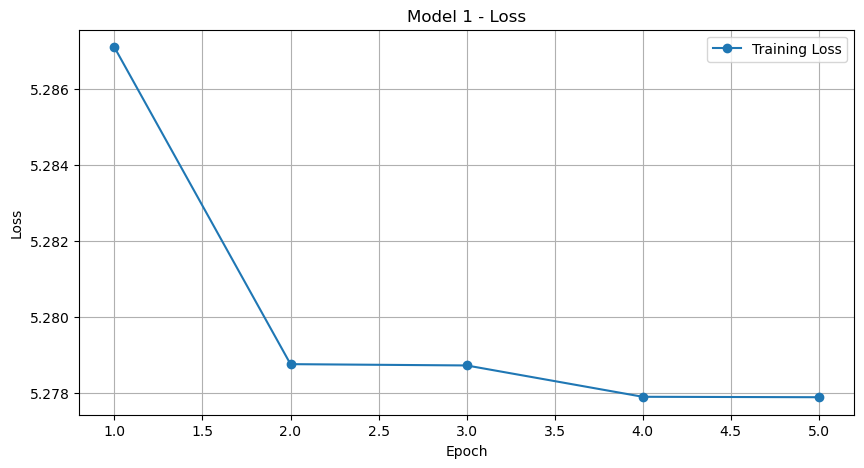

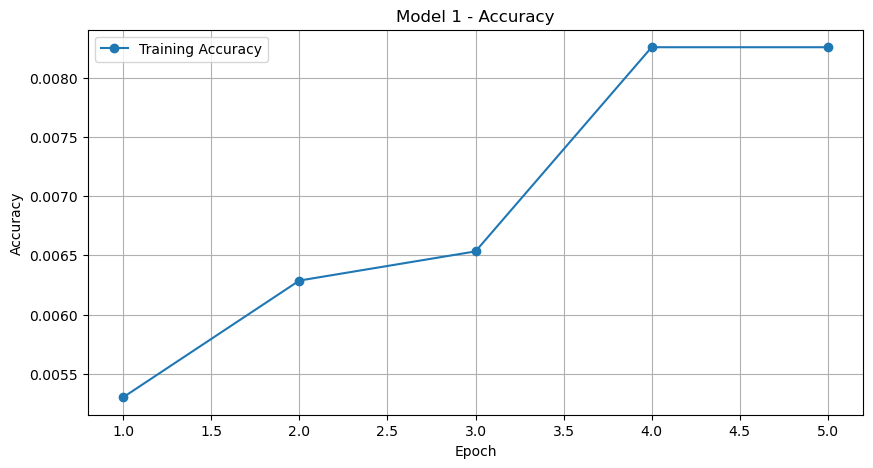

In [140]:
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(history_2.history['loss']) + 1), history_2.history['loss'], label='Training Loss', marker='o')
plt.title('Model 1 - Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(range(1, len(history_2.history['accuracy']) + 1), history_2.history['accuracy'], label='Training Accuracy', marker='o')
plt.title('Model 1 - Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:gold;">Model 3

In [91]:
model_3 = Sequential()
model_3.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)))
model_3.add(MaxPooling2D(pool_size=(2, 2)))
model_3.add(Conv2D(64, (3, 3), activation='relu'))
model_3.add(MaxPooling2D(pool_size=(2, 2)))
model_3.add(Conv2D(128, (3, 3), activation='relu'))
model_3.add(MaxPooling2D(pool_size=(2, 2)))
model_3.add(Conv2D(256, (3, 3), activation='relu'))
model_3.add(MaxPooling2D(pool_size=(2, 2)))
model_3.add(Conv2D(512, (3, 3), activation='relu'))
model_3.add(MaxPooling2D(pool_size=(2, 2)))
model_3.add(Flatten())
model_3.add(Dense(512, activation='relu'))
model_3.add(Dropout(0.5))
model_3.add(Dense(num_classes, activation='softmax'))

model_3.compile(loss='categorical_crossentropy', optimizer='adagrad', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history_3 = model_3.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=10,  
    validation_data=validation_generator,
    validation_steps=len(validation_generator),
    callbacks=[early_stopping])

Epoch 1/10
255/255 [==============================] - 435s 2s/step - loss: 5.2806 - accuracy: 0.0047 - val_loss: 5.2779 - val_accuracy: 0.0057
Epoch 2/10
255/255 [==============================] - 433s 2s/step - loss: 5.2789 - accuracy: 0.0048 - val_loss: 5.2768 - val_accuracy: 0.0073
Epoch 3/10
255/255 [==============================] - 434s 2s/step - loss: 5.2772 - accuracy: 0.0070 - val_loss: 5.2763 - val_accuracy: 0.0056
Epoch 4/10
255/255 [==============================] - 430s 2s/step - loss: 5.2775 - accuracy: 0.0048 - val_loss: 5.2759 - val_accuracy: 0.0065
Epoch 5/10
255/255 [==============================] - 434s 2s/step - loss: 5.2766 - accuracy: 0.0056 - val_loss: 5.2756 - val_accuracy: 0.0075
Epoch 6/10
255/255 [==============================] - 432s 2s/step - loss: 5.2767 - accuracy: 0.0070 - val_loss: 5.2753 - val_accuracy: 0.0073
Epoch 7/10
255/255 [==============================] - 432s 2s/step - loss: 5.2757 - accuracy: 0.0061 - val_loss: 5.2751 - val_accuracy: 0.0075

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:Lightblue;">Lets save the Model and Model Weights

In [92]:
model_3.save('C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Milestone 1/Milestone_1_Model_3.h5') 
model_3.save_weights('C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Milestone 1/Milestone_1_Model_3_weights.h5')
loaded_model_3 = load_model('C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Milestone 1/Milestone_1_Model_3.h5')
loaded_model_3.load_weights('C:/Users/SAIF/Desktop/Great Learning/Capstone Project/Car Detection Project/Milestone 1/Milestone_1_Model_3_weights.h5')

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:Lightblue;">Lets analyze the model 3 performance on our Test Data

In [93]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    classes=validation_classes  
)
test_loss, test_acc = loaded_model_3.evaluate(test_generator)
print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

Found 8041 images belonging to 196 classes.
252/252 [==============================] - 116s 458ms/step - loss: 5.2742 - accuracy: 0.0085
Test Accuracy: 0.008456659503281116
Test Loss: 5.274209499359131


###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:Lightblue;">Let plot the Training and Validation Loss as well as Training and Validation Accuracy for Model 3

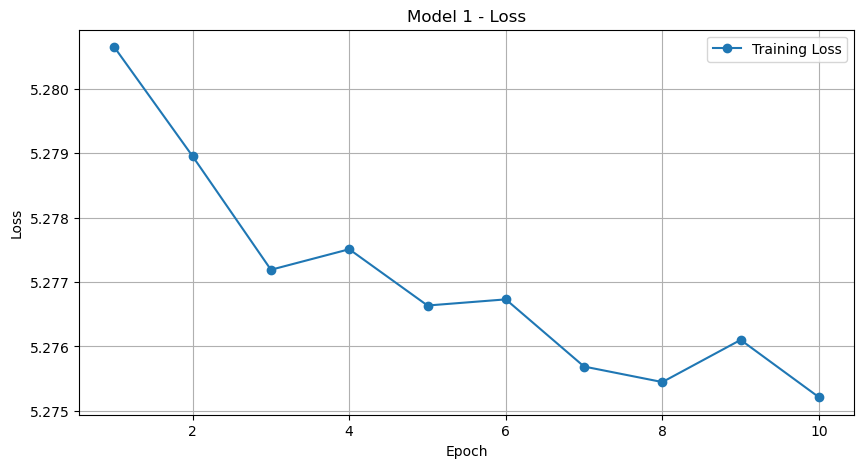

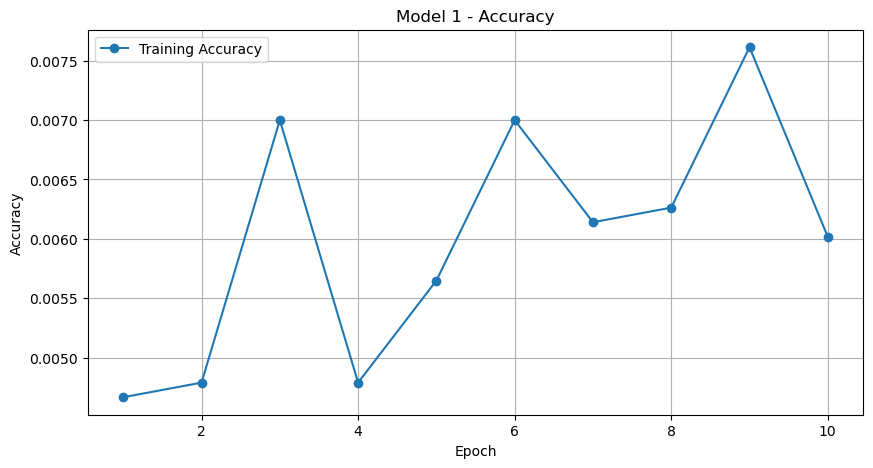

In [128]:
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(history_3.history['loss']) + 1), history_3.history['loss'], label='Training Loss', marker='o')
plt.title('Model 1 - Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(range(1, len(history_3.history['accuracy']) + 1), history_3.history['accuracy'], label='Training Accuracy', marker='o')
plt.title('Model 1 - Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:cyan;">Lets compare and evaluate the performace of all the 3 CNN models

In [141]:
train_acc_1 = history_1.history['accuracy']
test_acc_1 = history_1.history['val_accuracy']
train_loss_1 = history_1.history['loss']
test_loss_1 = history_1.history['val_loss']

train_acc_2 = history_2.history['accuracy']
test_acc_2 = history_2.history['val_accuracy']
train_loss_2 = history_2.history['loss']
test_loss_2 = history_2.history['val_loss']

train_acc_3 = history_3.history['accuracy']
test_acc_3 = history_3.history['val_accuracy']
train_loss_3 = history_3.history['loss']
test_loss_3 = history_3.history['val_loss']

final_train_acc_1 = train_acc_1[-1]
final_test_acc_1 = test_acc_1[-1]
final_train_loss_1 = train_loss_1[-1]
final_test_loss_1 = test_loss_1[-1]

final_train_acc_2 = train_acc_2[-1]
final_test_acc_2 = test_acc_2[-1]
final_train_loss_2 = train_loss_2[-1]
final_test_loss_2 = test_loss_2[-1]

final_train_acc_3 = train_acc_3[-1]
final_test_acc_3 = test_acc_3[-1]
final_train_loss_3 = train_loss_3[-1]
final_test_loss_3 = test_loss_3[-1]

metrics_data = {
    'Model': ['Model 1', 'Model 2', 'Model 3'],
    'Train Accuracy': [final_train_acc_1, final_train_acc_2, final_train_acc_3],
    'Test Accuracy': [final_test_acc_1, final_test_acc_2, final_test_acc_3],
    'Train Loss': [final_train_loss_1, final_train_loss_2, final_train_loss_3],
    'Test Loss': [final_test_loss_1, final_test_loss_2, final_test_loss_3]
}

metrics_df = pd.DataFrame(metrics_data)
metrics_df

,Model,Train Accuracy,Test Accuracy,Train Loss,Test Loss
0,Model 1,0.216100,0.009700,3.549627,5.185400
1,Model 2,0.008259,0.005472,5.277876,5.277879
2,Model 3,0.006017,0.008457,5.275213,5.274206


### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:pink;">Insights and Observations : 

---------------------
###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:lightblue;">Model 1:

* Train Accuracy: 21.61%
* Test Accuracy: 0.97%
* Train Loss: 3.55
* Test Loss: 5.19
* This model demonstrates a notably higher train accuracy compared to the test accuracy, indicating potential overfitting. The high discrepancy between the train and test accuracies suggests that the model may not generalize well to unseen data.

---------------------
###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:lightblue;">Model 2:

* Train Accuracy: 0.83%
* Test Accuracy: 0.55%
* Train Loss: 5.28
* Test Loss: 5.28
* Both the train and test accuracies are quite low, suggesting that this model is not capturing the patterns in the data effectively. The similar train and test losses indicate that the model is not overfitting, but it is not learning the underlying patterns well.

---------------------
###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:lightblue;">Model 3:

* Train Accuracy: 0.60%
* Test Accuracy: 0.85%
* Train Loss: 5.28
* Test Loss: 5.27
* Similar to Model 2, this model also shows low train and test accuracies. However, the test accuracy is comparatively higher than the train accuracy, indicating that it might be performing slightly better on unseen data.

---------------------
###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:lightblue;">Overall Assessment:

* All three models exhibit low test accuracies, suggesting that they are not effectively capturing the patterns in the data.
* Model 1 shows signs of overfitting, while Models 2 and 3 display poor performance on both the train and test sets.

---------------------
###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:lightblue;">Methods of Optimization:

* The activation function (sigmoid) and optimizer (SGD) selected by Model 2 for the output layer are different from those of the other models (softmax, Adam and Adagrad).
* The variations in model performance that have been reported may be attributed to these changes in optimization strategies.

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:gold;">Let's now, at last, see how well each of our three models has done in terms of classifying the car photos.

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:brown;">Model 1

1/1 [==============================] - 0s 86ms/step


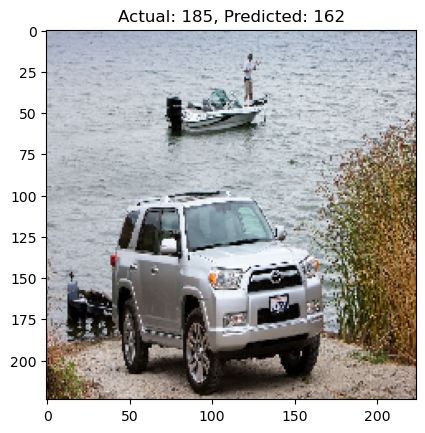

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 56ms/step


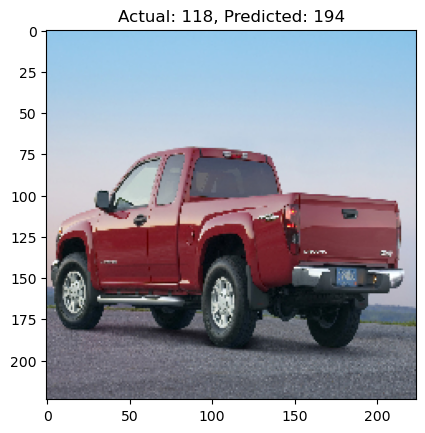

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 35ms/step


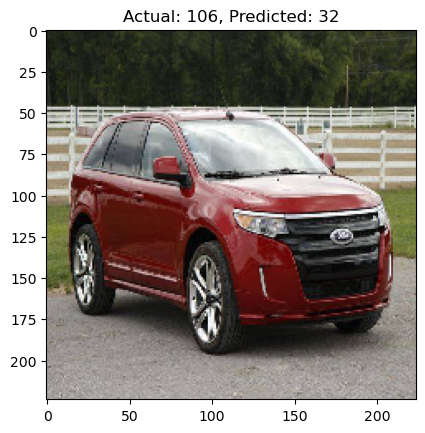

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 36ms/step


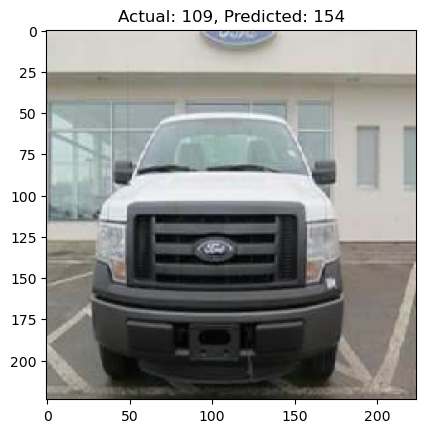

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 35ms/step


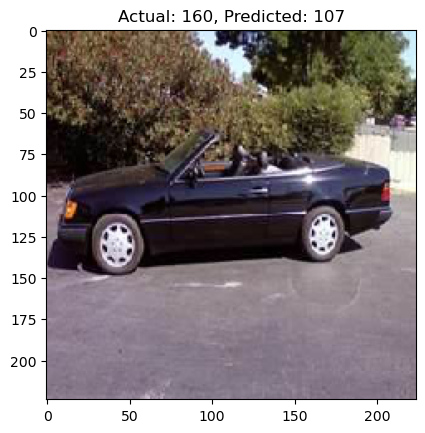

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 35ms/step


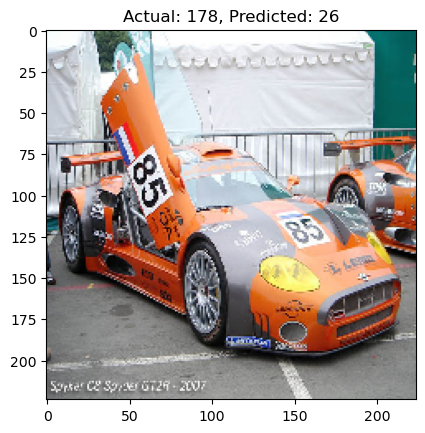

Press 'n' to see the next image, or 'q' to quit: q
End of interactive image display.


In [130]:
num_images_to_test = 5
current_index = 0

while current_index < len(test_images):
    actual_label = test_labels[current_index].argmax()
    predictions = loaded_model_1.predict(test_images[current_index].reshape(1, img_width, img_height, 3))
    predicted_label = predictions[0].argmax()
    plt.imshow(test_images[current_index])
    plt.title(f'Actual: {actual_label}, Predicted: {predicted_label}')
    plt.show()
    choice = input("Press 'n' to see the next image, or 'q' to quit: ")
    if choice == 'n':
        current_index += 1
    elif choice == 'q':
        break
    else:
        print("Invalid choice. Please try again.")

print("End of interactive image display.")

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:brown;">Model 2

1/1 [==============================] - 0s 40ms/step


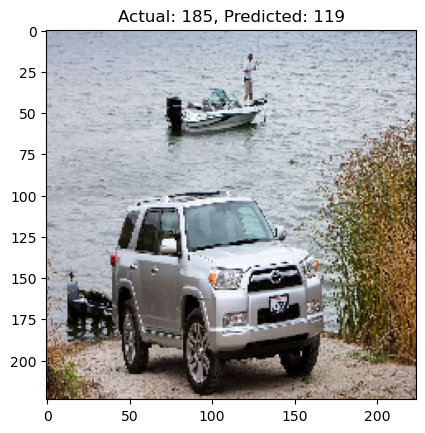

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 45ms/step


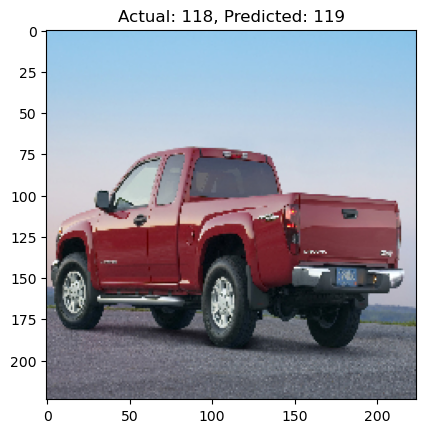

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 42ms/step


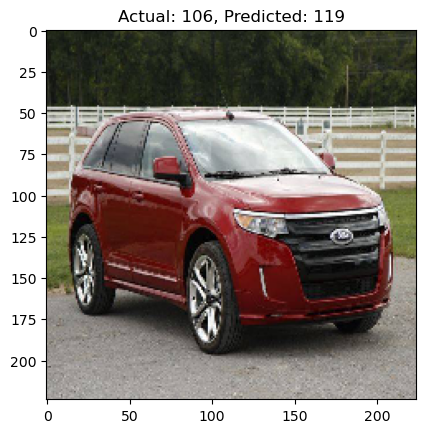

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 44ms/step


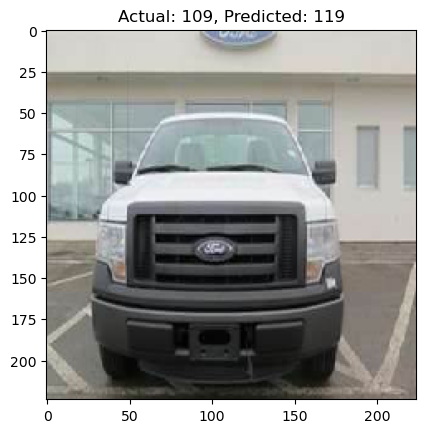

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 46ms/step


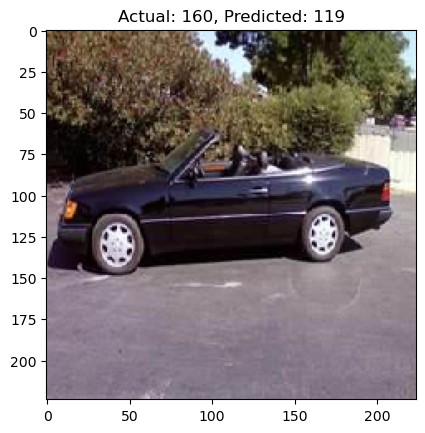

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 36ms/step


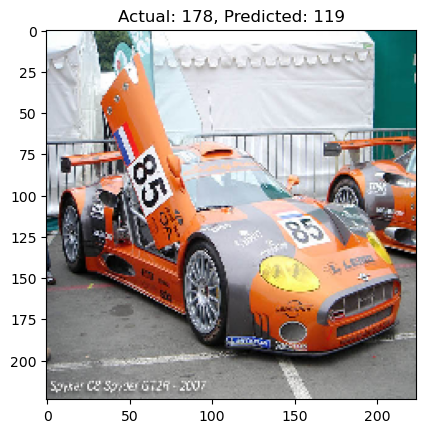

Press 'n' to see the next image, or 'q' to quit: q
End of interactive image display.


In [144]:
num_images_to_test = 5
current_index = 0

while current_index < len(test_images):
    actual_label = test_labels[current_index].argmax()
    predictions = loaded_model_2.predict(test_images[current_index].reshape(1, img_width, img_height, 3))
    predicted_label = predictions[0].argmax()
    plt.imshow(test_images[current_index])
    plt.title(f'Actual: {actual_label}, Predicted: {predicted_label}')
    plt.show()
    choice = input("Press 'n' to see the next image, or 'q' to quit: ")
    if choice == 'n':
        current_index += 1
    elif choice == 'q':
        break
    else:
        print("Invalid choice. Please try again.")

print("End of interactive image display.")

###### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:brown;">Model 3

1/1 [==============================] - 0s 27ms/step


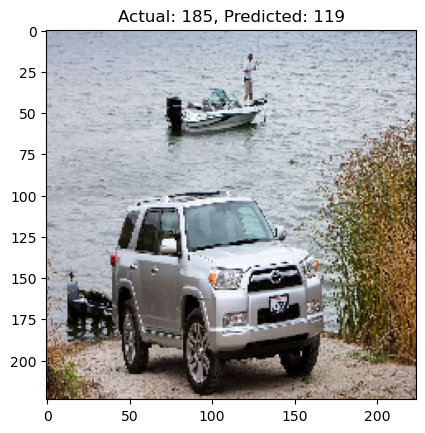

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 38ms/step


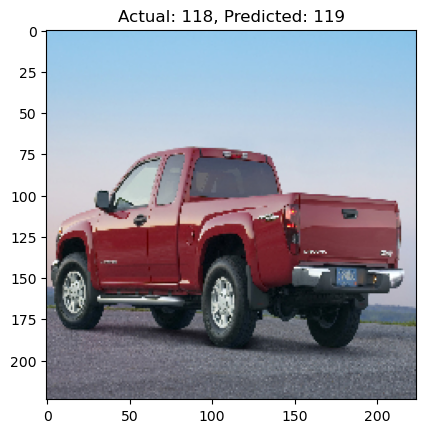

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 27ms/step


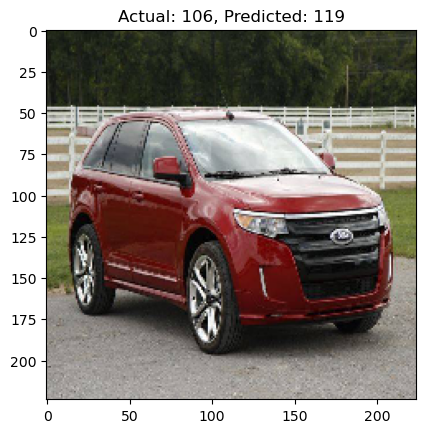

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 27ms/step


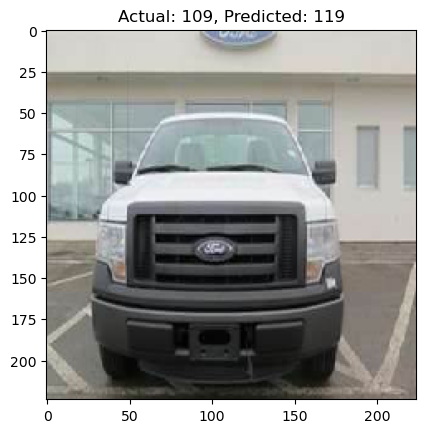

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 28ms/step


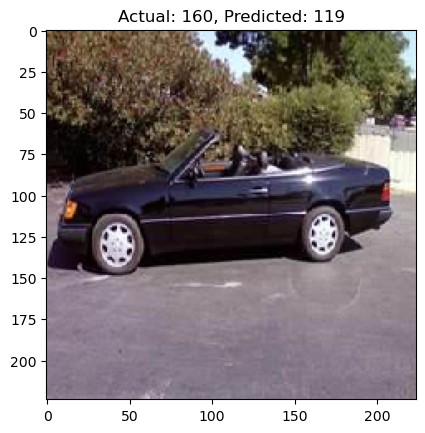

Press 'n' to see the next image, or 'q' to quit: n
1/1 [==============================] - 0s 29ms/step


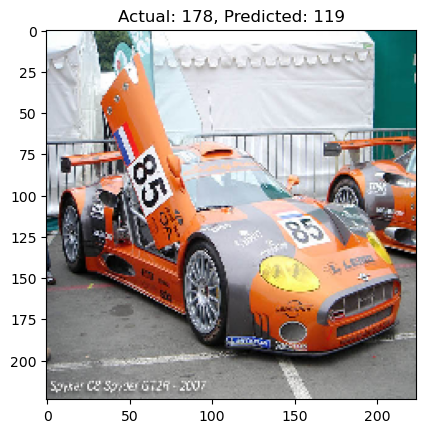

Press 'n' to see the next image, or 'q' to quit: q
End of interactive image display.


In [106]:
num_images_to_test = 5
current_index = 0

while current_index < len(test_images):
    actual_label = test_labels[current_index].argmax()
    predictions = loaded_model_3.predict(test_images[current_index].reshape(1, img_width, img_height, 3))
    predicted_label = predictions[0].argmax()
    plt.imshow(test_images[current_index])
    plt.title(f'Actual: {actual_label}, Predicted: {predicted_label}')
    plt.show()
    choice = input("Press 'n' to see the next image, or 'q' to quit: ")
    if choice == 'n':
        current_index += 1
    elif choice == 'q':
        break
    else:
        print("Invalid choice. Please try again.")

print("End of interactive image display.")

##### <span style="font-family: Arial; font-weight:bold;font-size:2em;color:grey;">-*-*-*-*-*-*-*-*-*-*-*-*End of Project-Milestone 1-*-*-*-*-*-*-*-*-*-*-*-*